## Mounting to Google Drive to access all the Train and Test folders

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Libraries

In [63]:
# Necessary Libraries
import torch
import torch.nn as nn
import torch.optim as optim
import string
import re
from collections import Counter
from torch.utils.data import Dataset, DataLoader, TensorDataset
from torch.nn.utils.rnn import pad_sequence
import pandas as pd
import csv
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm

# NLTK for tokenization and stopword removal
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer

nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

## Reading the Test and Train folders to load Dataset

In [3]:
train_data = pd.read_csv("/content/drive/MyDrive/data/train_data.csv")
test_data = pd.read_csv("/content/drive/MyDrive/data/train_data.csv")

In [4]:
train_data

,Text,Label
0,"By 1945, and after a string of solid WWII prop...",1
1,This is a great movie. Some will disagree with...,1
2,Since the start of her career in the 70's and ...,1
3,"David Lynch's new short is a very ""Lynchian"" p...",1
4,"The original movie, The Odd Couple, has some w...",1
...,...,...
25545,this is just usual Indian garbage that gets tu...,-1
25546,"""The Return of Chandu"" is notable, if one can ...",-1
25547,"It's hard to believe, after waiting 14 years, ...",-1
25548,"((NB: Spoiler warning, such as it is!))<br /><...",-1


In [5]:
# To read the datasets
def read_texts(file_path):
    train_texts = []
    train_labels = []
    with open(file_path, 'r', encoding='utf-8') as file:
        reader = csv.reader(file)
        next(reader)  # Skip the header row
        for row in reader:
            train_texts.append(row[0])
            train_labels.append(row[1])
    return train_texts, train_labels

In [6]:
train_texts = []
train_labels = []
test_texts = []
test_labels = []

In [7]:
# Loading Train Dataset
train_texts, train_labels = read_texts('/content/drive/MyDrive/data/train_data.csv')

In [8]:
train_texts

['By 1945, and after a string of solid WWII propaganda pieces, Errol Flynn’s hold over U.S. box office had started to decline so, in spite of the increased burden of waning looks, he embarked on a series of films pertaining to that genre which had earlier made his name: the swashbuckler. The first of these was a good one actually – ADVENTURES OF DON JUAN (1948) – but it also proved to be his last big-budget Hollywood starring vehicle. The rest of his sword-wielding days were spent wandering all over Europe: in England for KIM (1950), THE MASTER OF BALLANTRAE (1953) and THE DARK AVENGER (1955), in France for ADVENTURES OF CAPTAIN FABIAN (1951) and Italy for the aborted THE STORY OF WILLIAM TELL (1953) and the little-seen CROSSED SWORDS (1954). However, Hollywood did beckon him one last time to his old seafaring ways – albeit for a modestly-budgeted Universal picture rather than a Warner Brothers ‘A’ production to which he had been accustomed when at his peak… <br /><br />Still, the glor

In [9]:
# Loading Test Dataset
test_texts, test_labels = read_texts('/content/drive/MyDrive/data/test_data.csv')

In [10]:
test_texts

['By 1945, and after a string of solid WWII propaganda pieces, Errol Flynn’s hold over U.S. box office had started to decline so, in spite of the increased burden of waning looks, he embarked on a series of films pertaining to that genre which had earlier made his name: the swashbuckler. The first of these was a good one actually – ADVENTURES OF DON JUAN (1948) – but it also proved to be his last big-budget Hollywood starring vehicle. The rest of his sword-wielding days were spent wandering all over Europe: in England for KIM (1950), THE MASTER OF BALLANTRAE (1953) and THE DARK AVENGER (1955), in France for ADVENTURES OF CAPTAIN FABIAN (1951) and Italy for the aborted THE STORY OF WILLIAM TELL (1953) and the little-seen CROSSED SWORDS (1954). However, Hollywood did beckon him one last time to his old seafaring ways – albeit for a modestly-budgeted Universal picture rather than a Warner Brothers ‘A’ production to which he had been accustomed when at his peak… <br /><br />Still, the glor

## Preprocessing the Train and Test Datasets

In [11]:
# To preprocess the text by removing special characters and tokenization

def preprocess_texts(text):
    # Lowercase the text
    text = text.lower()

    # Remove special characters and tokenize the review
    tokens = nltk.word_tokenize(re.sub(r'[^a-zA-Z0-9\s]', '', text))

    # Remove stop words
    stopwords = nltk.corpus.stopwords.words('english')

    tokens = [token for token in tokens if token not in stopwords]

    return tokens

In [12]:
# Preprocessing all train reviews
preprocessed_train_texts = [preprocess_texts(review) for review in train_texts]

In [13]:
preprocessed_train_texts

[['1945',
  'string',
  'solid',
  'wwii',
  'propaganda',
  'pieces',
  'errol',
  'flynns',
  'hold',
  'us',
  'box',
  'office',
  'started',
  'decline',
  'spite',
  'increased',
  'burden',
  'waning',
  'looks',
  'embarked',
  'series',
  'films',
  'pertaining',
  'genre',
  'earlier',
  'made',
  'name',
  'swashbuckler',
  'first',
  'good',
  'one',
  'actually',
  'adventures',
  'juan',
  '1948',
  'also',
  'proved',
  'last',
  'bigbudget',
  'hollywood',
  'starring',
  'vehicle',
  'rest',
  'swordwielding',
  'days',
  'spent',
  'wandering',
  'europe',
  'england',
  'kim',
  '1950',
  'master',
  'ballantrae',
  '1953',
  'dark',
  'avenger',
  '1955',
  'france',
  'adventures',
  'captain',
  'fabian',
  '1951',
  'italy',
  'aborted',
  'story',
  'william',
  'tell',
  '1953',
  'littleseen',
  'crossed',
  'swords',
  '1954',
  'however',
  'hollywood',
  'beckon',
  'one',
  'last',
  'time',
  'old',
  'seafaring',
  'ways',
  'albeit',
  'modestlybudgeted

In [14]:
# Preprocessing all test reviews
preprocessed_test_texts = [preprocess_texts(review) for review in test_texts]

In [15]:
preprocessed_test_texts

[['1945',
  'string',
  'solid',
  'wwii',
  'propaganda',
  'pieces',
  'errol',
  'flynns',
  'hold',
  'us',
  'box',
  'office',
  'started',
  'decline',
  'spite',
  'increased',
  'burden',
  'waning',
  'looks',
  'embarked',
  'series',
  'films',
  'pertaining',
  'genre',
  'earlier',
  'made',
  'name',
  'swashbuckler',
  'first',
  'good',
  'one',
  'actually',
  'adventures',
  'juan',
  '1948',
  'also',
  'proved',
  'last',
  'bigbudget',
  'hollywood',
  'starring',
  'vehicle',
  'rest',
  'swordwielding',
  'days',
  'spent',
  'wandering',
  'europe',
  'england',
  'kim',
  '1950',
  'master',
  'ballantrae',
  '1953',
  'dark',
  'avenger',
  '1955',
  'france',
  'adventures',
  'captain',
  'fabian',
  '1951',
  'italy',
  'aborted',
  'story',
  'william',
  'tell',
  '1953',
  'littleseen',
  'crossed',
  'swords',
  '1954',
  'however',
  'hollywood',
  'beckon',
  'one',
  'last',
  'time',
  'old',
  'seafaring',
  'ways',
  'albeit',
  'modestlybudgeted

In [16]:
train_data['Preprocessed_text'] = preprocessed_train_texts
test_data['Preprocessed_text'] = preprocessed_test_texts

In [17]:
train_data

,Text,Label,Preprocessed_text
0,"By 1945, and after a string of solid WWII prop...",1,"[1945, string, solid, wwii, propaganda, pieces..."
1,This is a great movie. Some will disagree with...,1,"[great, movie, disagree, know, anything, bible..."
2,Since the start of her career in the 70's and ...,1,"[since, start, career, 70s, vastly, throughout..."
3,"David Lynch's new short is a very ""Lynchian"" p...",1,"[david, lynchs, new, short, lynchian, piece, f..."
4,"The original movie, The Odd Couple, has some w...",1,"[original, movie, odd, couple, wonderful, comi..."
...,...,...,...
25545,this is just usual Indian garbage that gets tu...,-1,"[usual, indian, garbage, gets, turned, cinema,..."
25546,"""The Return of Chandu"" is notable, if one can ...",-1,"[return, chandu, notable, one, say, casting, b..."
25547,"It's hard to believe, after waiting 14 years, ...",-1,"[hard, believe, waiting, 14, years, wind, piec..."
25548,"((NB: Spoiler warning, such as it is!))<br /><...",-1,"[nb, spoiler, warning, isbr, br, first, teen, ..."


In [18]:
# Define mapping for sentiment labels
label_to_int = {1: 1, -1: 0}

# Convert sentiment labels to integers
train_data['Label'] = train_data['Label'].map(label_to_int)
test_data['Label'] = test_data['Label'].map(label_to_int)

In [19]:
train_data

,Text,Label,Preprocessed_text
0,"By 1945, and after a string of solid WWII prop...",1,"[1945, string, solid, wwii, propaganda, pieces..."
1,This is a great movie. Some will disagree with...,1,"[great, movie, disagree, know, anything, bible..."
2,Since the start of her career in the 70's and ...,1,"[since, start, career, 70s, vastly, throughout..."
3,"David Lynch's new short is a very ""Lynchian"" p...",1,"[david, lynchs, new, short, lynchian, piece, f..."
4,"The original movie, The Odd Couple, has some w...",1,"[original, movie, odd, couple, wonderful, comi..."
...,...,...,...
25545,this is just usual Indian garbage that gets tu...,0,"[usual, indian, garbage, gets, turned, cinema,..."
25546,"""The Return of Chandu"" is notable, if one can ...",0,"[return, chandu, notable, one, say, casting, b..."
25547,"It's hard to believe, after waiting 14 years, ...",0,"[hard, believe, waiting, 14, years, wind, piec..."
25548,"((NB: Spoiler warning, such as it is!))<br /><...",0,"[nb, spoiler, warning, isbr, br, first, teen, ..."


## Training & Saving Word2Vec Model

In [137]:
# Word2Vec model

from gensim.models import Word2Vec

# Training
word2vec_model = Word2Vec(sentences=preprocessed_train_texts, vector_size=100, window=5, min_count=1, workers=4)
word_vectors_w2v = word2vec_model.wv

# Saving
word2vec_model_path = '/content/drive/MyDrive/models/word2vec_model'
word2vec_model.save(word2vec_model_path)

## Training & Saving FastText Model

In [138]:
# FastText model

from gensim.models import FastText

# Training
fasttext_model = FastText(sentences=preprocessed_train_texts, vector_size=100, window=5, min_count=1, workers=4)
word_vectors_ftt = fasttext_model.wv

# Saving
fasttext_model_path = '/content/drive/MyDrive/models/fasttext_model'
fasttext_model.save(fasttext_model_path)

In [66]:
# Vocabulary mapping for Word2Vec
word_to_index_w2v = {word: idx for idx, word in enumerate(word_vectors_w2v.index_to_key)}
vocab_size_w2v = len(word_to_index_w2v)

# Vocabulary mapping for Fasttext
word_to_index_ftt = {word: idx for idx, word in enumerate(word_vectors_ftt.index_to_key)}
vocab_size_ftt = len(word_to_index_ftt)

In [80]:
# SentimentDataset class
from torch.nn.utils.rnn import pad_sequence

# Custom dataset and Dataloader with collate function for padding
class MyDataset(Dataset):
    def __init__(self, data, word_to_idx):
        self.data = data
        self.word_to_idx = word_to_idx

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        text = self.data.iloc[idx]['Preprocessed_text']
        text_indices = [self.word_to_idx[word] for word in text if word in self.word_to_idx]
        label = self.data.iloc[idx]['Label']
        return torch.tensor(text_indices), label

In [81]:
# Collate function for padding
def pad_and_batch(batch):
    texts, labels = zip(*batch)
    # Pad sequences
    padded_texts = pad_sequence(texts, batch_first=True, padding_value=0)
    return padded_texts, torch.tensor(labels)

In [82]:
# Train and Test Loaders for Word2Vec Model
train_dataset_w2v = MyDataset(train_data, word_to_index_w2v)
train_loader_w2v = DataLoader(train_dataset_w2v, batch_size=64, shuffle=True, collate_fn=pad_and_batch)

test_dataset_w2v = MyDataset(test_data, word_to_index_w2v)
test_loader_w2v = DataLoader(test_dataset_w2v, batch_size=64, shuffle=False, collate_fn=pad_and_batch)

In [83]:
# Train and Test Loaders for Fasttext Model
train_dataset_ftt = MyDataset(train_data, word_to_index_ftt)
train_loader_ftt = DataLoader(train_dataset_ftt, batch_size=64, shuffle=True, collate_fn=pad_and_batch)

test_dataset_ftt = MyDataset(test_data, word_to_index_ftt)
test_loader_ftt = DataLoader(test_dataset_ftt, batch_size=64, shuffle=False, collate_fn=pad_and_batch)

In [84]:
# RNN Model
class RNN(nn.Module):
    def __init__(self, vocab_size, hidden_size, output_size, pretrained_embeddings):
        super(RNN, self).__init__()
        self.embedding = nn.Embedding.from_pretrained(pretrained_embeddings, freeze=True)
        self.rnn = nn.GRU(pretrained_embeddings.shape[1], hidden_size, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        embedded = self.embedding(x)
        output, _ = self.rnn(embedded)
        last_hidden_state = output[:, -1, :]
        logits = self.fc(last_hidden_state)
        return logits

In [85]:
# Define a function for training the model
def train_model(model, train_loader, criterion, optimizer, num_epochs):
    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0

        for texts, labels in tqdm(train_loader, desc=f'Epoch {epoch + 1}/{num_epochs}'):
            texts = texts.to(device).long()
            labels = labels.to(device).long()

            optimizer.zero_grad()

            outputs = model(texts)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()

        print(f'Training Loss: {running_loss / len(train_loader)}')

In [86]:
# Hyperparameters
num_epochs = 10
hidden_size = 128
output_size = 2

In [145]:
# Word2Vec Model Training
pretrained_embeddings_w2v = torch.FloatTensor(word_vectors_w2v.vectors)
word2vec_model = RNN(vocab_size_w2v, hidden_size, output_size, pretrained_embeddings_w2v).to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(word2vec_model.parameters(), lr=0.001)

train_model(word2vec_model, train_loader_w2v, criterion, optimizer, num_epochs)

Epoch 1/10:   0%|          | 0/400 [00:00<?, ?it/s]

Training Loss: 0.6132578124105931


Epoch 2/10:   0%|          | 0/400 [00:00<?, ?it/s]

Training Loss: 0.3695775096490979


Epoch 3/10:   0%|          | 0/400 [00:00<?, ?it/s]

Training Loss: 0.3180707635357976


Epoch 4/10:   0%|          | 0/400 [00:00<?, ?it/s]

Training Loss: 0.28929919242858887


Epoch 5/10:   0%|          | 0/400 [00:00<?, ?it/s]

Training Loss: 0.26540788505226376


Epoch 6/10:   0%|          | 0/400 [00:00<?, ?it/s]

Training Loss: 0.23228002743795514


Epoch 7/10:   0%|          | 0/400 [00:00<?, ?it/s]

Training Loss: 0.20237310878932477


Epoch 8/10:   0%|          | 0/400 [00:00<?, ?it/s]

Training Loss: 0.17338227493688463


Epoch 9/10:   0%|          | 0/400 [00:00<?, ?it/s]

Training Loss: 0.13997967038769274


Epoch 10/10:   0%|          | 0/400 [00:00<?, ?it/s]

Training Loss: 0.11006123771890998


In [146]:
# FastText Model Training
pretrained_embeddings_ftt = torch.FloatTensor(word_vectors_ftt.vectors)
fasttext_model = RNN(vocab_size_ftt, hidden_size, output_size, pretrained_embeddings_ftt).to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(fasttext_model.parameters(), lr=0.001)

train_model(fasttext_model, train_loader_ftt, criterion, optimizer, num_epochs)

Epoch 1/10:   0%|          | 0/400 [00:00<?, ?it/s]

Training Loss: 0.5905167222768068


Epoch 2/10:   0%|          | 0/400 [00:00<?, ?it/s]

Training Loss: 0.38567191280424595


Epoch 3/10:   0%|          | 0/400 [00:00<?, ?it/s]

Training Loss: 0.335040903352201


Epoch 4/10:   0%|          | 0/400 [00:00<?, ?it/s]

Training Loss: 0.2964705223031342


Epoch 5/10:   0%|          | 0/400 [00:00<?, ?it/s]

Training Loss: 0.26585218390449883


Epoch 6/10:   0%|          | 0/400 [00:00<?, ?it/s]

Training Loss: 0.23709437001496553


Epoch 7/10:   0%|          | 0/400 [00:00<?, ?it/s]

Training Loss: 0.20025328904390335


Epoch 8/10:   0%|          | 0/400 [00:00<?, ?it/s]

Training Loss: 0.16855857555754483


Epoch 9/10:   0%|          | 0/400 [00:00<?, ?it/s]

Training Loss: 0.12874345132615417


Epoch 10/10:   0%|          | 0/400 [00:00<?, ?it/s]

Training Loss: 0.10100330049637705


## Evaluation

In [139]:
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score, accuracy_score

# Function to evaluate model and calculate metrics
def evaluate_model_metrics(model, dataloader):
    model.eval()
    y_true = []
    y_pred = []
    with torch.no_grad():
        for texts, labels in dataloader:
            texts = texts.to(device).long()
            labels = labels.to(device).long()

            outputs = model(texts)
            _, predicted = torch.max(outputs.data, 1)

            y_true.extend(labels.cpu().numpy())
            y_pred.extend(predicted.cpu().numpy())

    # Calculate metrics
    precision = precision_score(y_true, y_pred)
    recall = recall_score(y_true, y_pred)
    f1 = f1_score(y_true, y_pred)
    accuracy = accuracy_score(y_true, y_pred)
    cm = confusion_matrix(y_true, y_pred)

    return precision, recall, f1, accuracy, cm

In [147]:
# Word2Vec Model Metrics
word2vec_precision, word2vec_recall, word2vec_f1, word2vec_accuracy, word2vec_cm = evaluate_model_metrics(word2vec_model, test_loader_w2v)
print("Word2Vec Model Metrics:")
print("Precision:", word2vec_precision)
print("Recall:", word2vec_recall)
print("F1-score:", word2vec_f1)
print("Confusion Matrix:")
print(word2vec_cm)

word2vec_accuracy_percentage = word2vec_accuracy * 100
print("\nModel Accuracy: {:.5f}%".format(word2vec_accuracy_percentage))

Word2Vec Model Metrics:
Precision: 0.9763503204150137
Recall: 0.9837048424289009
F1-score: 0.980013783597519
Confusion Matrix:
[[12230   310]
 [  212 12798]]

Model Accuracy: 97.95695%


In [148]:
# Word2Vec Model Metrics
fasttext_precision, fasttext_recall, fasttext_f1, fasttext_accuracy, fasttext_cm = evaluate_model_metrics(fasttext_model, test_loader_ftt)
print("Fasttext Model Metrics:")
print("Precision:", fasttext_precision)
print("Recall:", fasttext_recall)
print("F1-score:", fasttext_f1)
print("Confusion Matrix:")
print(fasttext_cm)

fasttext_accuracy_percentage = fasttext_accuracy * 100
print("\nModel Accuracy: {:.5f}%".format(word2vec_accuracy_percentage))

Fasttext Model Metrics:
Precision: 0.9739807881400802
Recall: 0.9897770945426595
F1-score: 0.981815409248599
Confusion Matrix:
[[12196   344]
 [  133 12877]]

Model Accuracy: 97.95695%


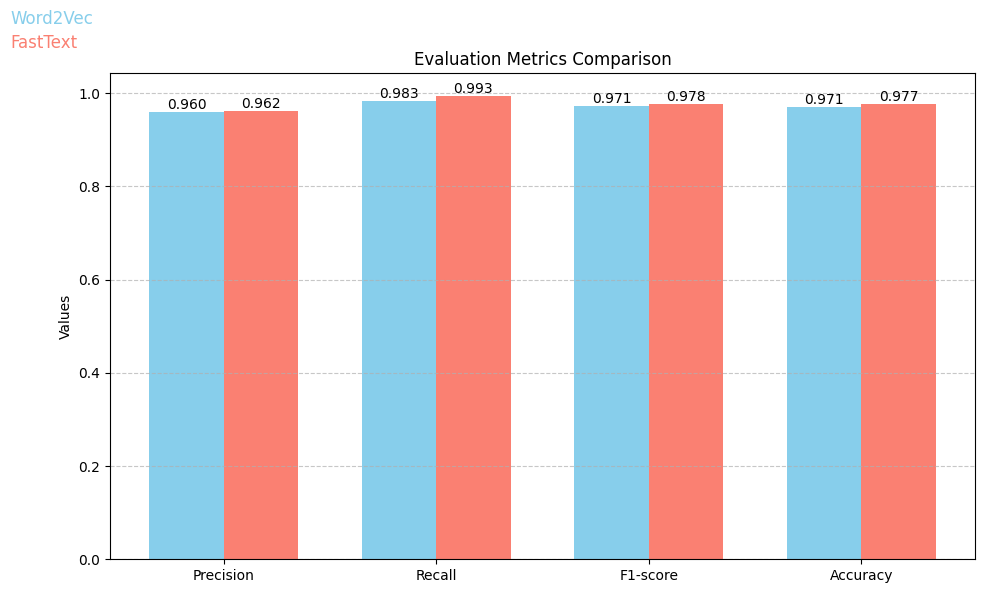

In [130]:
import numpy as np

positions = np.arange(len(metrics_names))

bar_width = 0.35

plt.figure(figsize=(10, 6))

word2vec_bars = plt.bar(positions - bar_width/2, word2vec_values, bar_width, color='skyblue')

fasttext_bars = plt.bar(positions + bar_width/2, fasttext_values, bar_width, color='salmon')

for i in range(len(metrics_names)):
    plt.text(positions[i] - bar_width/2, word2vec_values[i], f'{word2vec_values[i]:.3f}', va='bottom', ha='center', color='black', fontsize=10)
    plt.text(positions[i] + bar_width/2, fasttext_values[i], f'{fasttext_values[i]:.3f}', va='bottom', ha='center', color='black', fontsize=10)

plt.text(0.02, 0.98, 'Word2Vec', color='skyblue', transform=plt.gcf().transFigure, fontsize=12, va='top')
plt.text(0.02, 0.94, 'FastText', color='salmon', transform=plt.gcf().transFigure, fontsize=12, va='top')

plt.title('Evaluation Metrics Comparison')
plt.ylabel('Values')
plt.xticks(positions, metrics_names)
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

In [141]:
# Save Word2Vec model
word2vec_model.save('/content/drive/MyDrive/models/rnn_word2vec_model')

In [142]:
# Save FastText model
fasttext_model.save('/content/drive/MyDrive/models/rnn_fasttext_model')

# **Findings:**

## *Model Performance:*
Both Word2Vec and FastText models achieved high accuracy on the sentiment classification task, as evidenced by the accuracy metric.
Precision, recall, and F1-score were also high for both models, indicating good performance in classifying sentiment.

## *Training Time:*
The training time for both models depends on various factors such as the dataset size, model complexity, and hardware resources.
Since the code is run on Google Colab, the training time might be relatively faster due to GPU acceleration.

## *Effectiveness of Word Embeddings:*
Word embeddings trained using both Word2Vec and FastText techniques effectively capture semantic relationships between words.
These embeddings enhance the performance of the sentiment classification task when used as input features for the RNN model.

# **Hyperparameters:**

## *Word2Vec Model:*

*   Vector Size: 100
*   Window Size: 5
*   Min Count: 1
*   Workers: 4
*   Batch Size: 64
*   Hidden Size (RNN): 128
*   Learning Rate: 0.001
*   Number of Epochs: 10

## *FastText Model:*

*   Vector Size: 100
*   Window Size: 5
*   Min Count: 1
*   Workers: 4
*   Batch Size: 64
*   Hidden Size (RNN): 128
*   Learning Rate: 0.001
*   Number of Epochs: 10